In [1]:
from skfda import FDataGrid
from skfda.datasets import make_gaussian_process
from skfda.exploratory.visualization import SurfaceBoxplot, Boxplot

import matplotlib.pyplot as plt
import numpy as np

In [138]:
# %%
# %%
import os
import sys
import numpy as np
# from torch.utils.data import TensorDataset, DataLoader

# DL-Kit
# sys.path.append('/Users/hgoldwyn/Research/projects/SR_CNN/dl-kit') #TODO adjust path
# sys.path.append('/projects/ecrpstats/dl-kit') #TODO adjust path
# from dlkit.log.log_util import (logging_set_up, logging_get_logger)
# # from dlkit.nets.mlp import MLPModel
# from dlkit.opt.train import train_epochs
# from dlkit.nets.conv2d import Conv2dUpscaleModelInterpolate

## Load model module
sys.path.append('/Users/hgoldwyn/Research/projects/SR_CNN/paper_repo/auxilary_modules') #TODO adjust path
sys.path.append('/projects/ecrpstats/distributional_SRCNN/auxilary_modules')
import data_loading

import matplotlib.pyplot as plt

import pandas as pd


train_or_load = 'load'
# %%
hr_data_size = 64
lr_data_size = 8
# %%
epochs = 300
batch_size = 32
##
num_sing_mode = 50
##
region = 0
subregion = 'all'

log_file_base_path = 'parCov_fitting'

save_path = f'{log_file_base_path}.pt'

## ~~~~~~~~~~~
## import data
xtrainHR, xtestHR, xtrainLR, xtestLR = data_loading.import_data(
    region,
    subregion,
    train_fraction=.75, 
    order='(subregion, time)'
    )

failed to find data in /projects/...: [Errno 2] No such file or directory: '/projects/ecrpstats/distributional_SRCNN/data/subregions_wind_u_64x64.npy'


In [139]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [140]:
xtestHR[0].shape

(1, 64, 64)

Define basis functions

In [141]:
N = 64
def compl_dft_basis(x, y, k_x, k_y):
    return np.exp(1j * 2*np.pi * (k_x*x + k_y*y)/N)

In [142]:
x = np.arange(0, N)

xg = np.tile(x, N)            # generates x-coordinates for the entire grid N*K 
yg = np.repeat(x, N, axis=0)

mat_xg = xg.reshape((64, 64))
mat_yg = yg.reshape((64, 64))

In [143]:
## Create basis functions to max period
# max_T = 20
# min_k = int(N/max_T)
min_k = 0
print(f"min k : {min_k}")
# max_k = (N)//2
max_k = (N)//2 + 1
print(f"max k : {max_k}")

basis_function_k_idx = []
basis_functions = []
for _kx in range(min_k, max_k):
    for _ky in range(min_k, max_k):
        basis_functions.append(
            compl_dft_basis(
                mat_xg, 
                mat_yg, 
                _kx, 
                _ky
                )
            )
        basis_function_k_idx.append((_kx, _ky))
        
basis_functions = np.asarray(basis_functions).reshape((-1, 64**2)).T / N
basis_functions.shape

min k : 0
max k : 33


(4096, 1089)

Generate noise rescaling

Load covariance parameters

In [144]:
## Compute global noise
global_cov_params = np.load("../stage_2/output_2a/anal_sln_global_params.npy")

def get_noise_from_cov_params_fft(cov_params, n_samples=10, N=64):
    """
    Generate spatial noise realizations from Fourier-diagonal covariance.

    Parameters
    ----------
    cov_params : array, shape (1089,) or (33,33)
        Fourier power spectrum (rfft2 layout).
    n_samples : int
        Number of noise realizations.
    N : int
        Grid size (NxN).

    Returns
    -------
    noise : ndarray, shape (n_samples, N*N)
        Spatial noise samples.
    Zk : ndarray, shape (n_samples, 33, 33)
        Standard normal Fourier coefficients (complex).
    """

    # reshape to rfft2 half-plane
    s_k = cov_params.reshape(33, 33)

    # draw complex Gaussian Fourier coefficients
    Zr = np.random.randn(n_samples, 33, 33)
    Zi = np.random.randn(n_samples, 33, 33)
    Zk = (Zr + 1j * Zi) / np.sqrt(2.0)

    # scale by sqrt spectrum
    Fk = Zk * np.sqrt(s_k)[None, :, :]

    # inverse FFT to real space
    noise = np.fft.irfft2(Fk, s=(N, N), norm="ortho")

    return noise.reshape(n_samples, N * N), Zk

# Z = np.random.randn(100, hr_data_size**2)
# rescaled_noise = Z @ np.diag(s**0.5) @ u.T

rescaled_noise, Z = get_noise_from_cov_params_fft(global_cov_params, n_samples=100, N=64)

Load global model 

In [145]:
path_to_global_err_fields = "../stage_3/output_data/fcov_GL_mseStart_global_errFields.npy"
global_err_fields = np.load(path_to_global_err_fields)
global_err_fields.shape

targets = xtestHR.squeeze()

global_pred = global_err_fields + targets

def global_samples_for_plot(img_idx):
    _img_samples = rescaled_noise + global_pred[img_idx].ravel()[None, :]
    _out = _img_samples.reshape((-1, hr_data_size, hr_data_size))
    return _out


In [146]:
_for_plot = global_samples_for_plot(4)

In [147]:

from skfda import FDataGrid


In [148]:
from skfda.exploratory.visualization import Boxplot


Text(0.5, 1.3, 'Global Covariance')

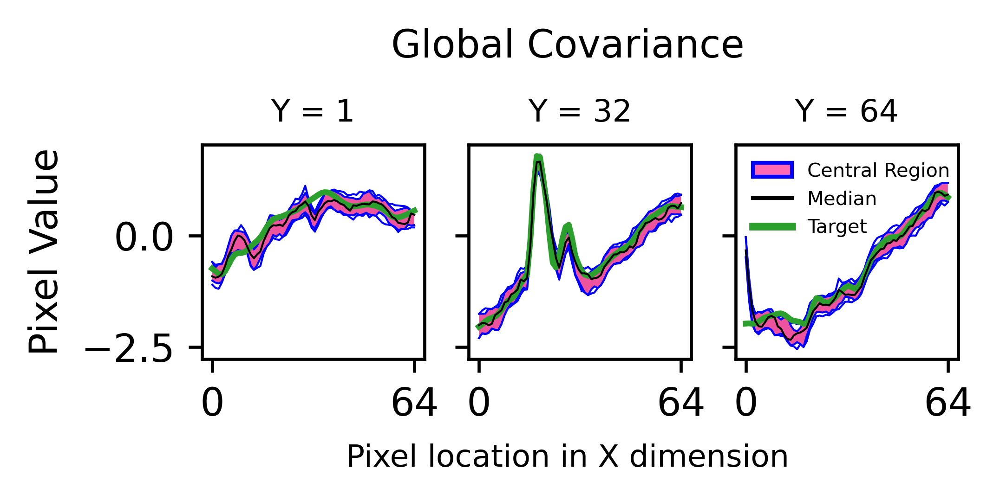

In [149]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.ticker import MaxNLocator

fig, axs = plt.subplots(1, 3, dpi=600, figsize=(3.5, 1), sharey=True)

_img_idx = 4
_img_samples = global_samples_for_plot(_img_idx)

sliced_fd_0 = FDataGrid(_img_samples[:, 0, :])
Boxplot(sliced_fd_0, axes=axs[0]).plot()

sliced_fd_1 = FDataGrid(_img_samples[:, 31, :])
Boxplot(sliced_fd_1, axes=axs[1]).plot()

sliced_fd_2 = FDataGrid(_img_samples[:, 63, :])
Boxplot(sliced_fd_2, axes=axs[2]).plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(0.5)
    # Set x-ticks from 0 to 64
    ax.set_xticks(np.linspace(0, 1, 2))  # 9 evenly spaced ticks (0 to 64 in steps of 8)
    ax.set_xticklabels(np.linspace(0, 64, 2, dtype=int))  # Labels 0 through 64

fig.canvas.draw()

axs[0].plot(np.linspace(0, 1, 64), targets[_img_idx, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[_img_idx, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[_img_idx, 63, :], color='C2', zorder=4, label='target')

## Legend 
custom_handles = [
    Patch(facecolor='#ff69b4', edgecolor='blue', label='Central Region'),
    Line2D([], [], color='black', linewidth=1, label='Median'),
    Line2D([0], [0], color='C2', linewidth=2, label='Target'),
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=5, frameon=False)

# Y-axis label
axs[0].set_ylabel('Pixel Value')

# Subplot titles
axs[0].set_title('Y = 1', fontsize=8)
axs[1].set_title('Y = 32', fontsize=8)
axs[2].set_title('Y = 64', fontsize=8)

# Shared x-axis label
fig.supxlabel('Pixel location in X dimension', fontsize=8,  y=-0.3)

# Shared figure title
fig.suptitle('Global Covariance', fontsize=10, y=1.3)

# Adjust layout to prevent overlap
# fig.tight_layout()


# img-specific model

In [16]:
## analytic results with correct downscaling
p0p7_cov_params = np.load(
    f"../cov_prediction/test_predicted_s.npy"
    )

p0p7_err = np.load(
    "../stage_3/output_data/fcov_GL_mseStart_gPAStdOn0p7_errFields.npy")

In [17]:
p0p7_pred = p0p7_err + targets

In [18]:
p0p7_pred.shape

(214, 64, 64)

In [19]:
p0p7_cov_params.shape

(214, 1089)

In [20]:
# test_p4p5_cov_params = p5p5_cov_params[-214:]
# test_p4p5_cov_params.shape

In [21]:
p0p7_img_4_noise, p0p7_img_4_Z = get_noise_from_cov_params_fft(p0p7_cov_params[4], n_samples=100, N=64)
# p5p5_img_100_noise = get_noise_from_cov_params_wSVD(test_p5p5_cov_params[100], n_samples=100)
# p5p5_img_200_noise = get_noise_from_cov_params_wSVD(test_p5p5_cov_params[200], n_samples=100)


In [22]:
# p5p5_img_4_noise.shape

In [23]:
# np.save('p5p5_img_4_noise.npy', p5p5_img_4_noise)
# np.save('sample_data/p2p5_img_100_noise.npy', p2p5_img_100_noise)
# np.save('sample_data/p2p5_img_200_noise.npy', p2p5_img_200_noise)

In [24]:
def p0p7_samples_for_plot(img, noise):
    _img_samples = noise + img.ravel()[None, :]
    _out = _img_samples.reshape((-1, hr_data_size, hr_data_size))
    return _out

In [25]:
p0p7_img4_samples = p0p7_samples_for_plot(
    p0p7_pred[4], 
    # p4p5_img_4_noise
    p0p7_img_4_noise  ## Using global noise
    )

Text(0.5, 1.3, 'Image-Specific Covariance')

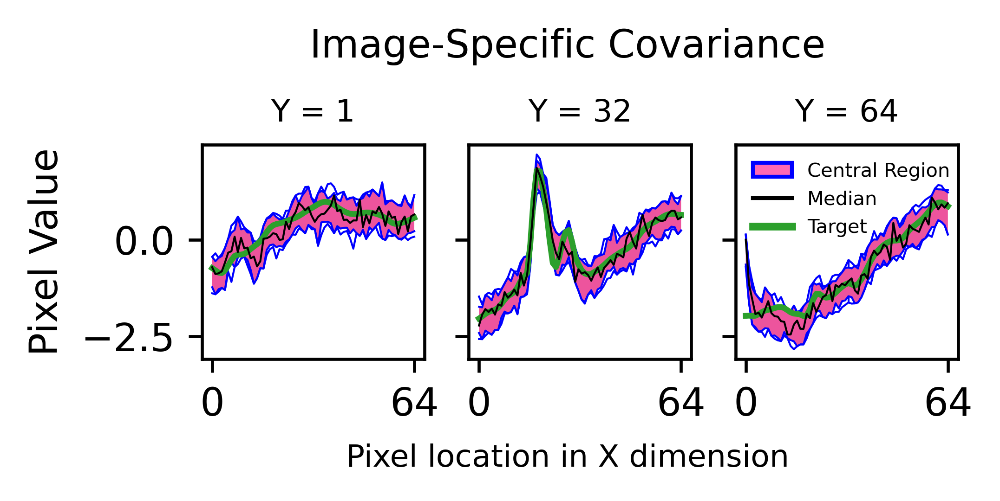

In [27]:

fig, axs = plt.subplots(1, 3, dpi=600, figsize=(3.5, 1), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)

_img_idx = 4

p0p7_img_idx_noise, p0p7_img_4_Z = get_noise_from_cov_params_fft(p0p7_cov_params[_img_idx], n_samples=100, N=64)


_img_samples = p0p7_samples_for_plot(
    p0p7_pred[_img_idx], 
    # p4p5_img_4_noise
    p0p7_img_idx_noise  ## Using global noise
    )

sliced_fd_0 = FDataGrid(_img_samples[:, 0, :])
Boxplot(sliced_fd_0, axes=axs[0]).plot()

sliced_fd_1 = FDataGrid(_img_samples[:, 31, :])
Boxplot(sliced_fd_1, axes=axs[1]).plot()

sliced_fd_2 = FDataGrid(_img_samples[:, 63, :])
Boxplot(sliced_fd_2, axes=axs[2]).plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(0.5)
    # Set x-ticks from 0 to 64
    ax.set_xticks(np.linspace(0, 1, 2))  # 9 evenly spaced ticks (0 to 64 in steps of 8)
    ax.set_xticklabels(np.linspace(0, 64, 2, dtype=int))  # Labels 0 through 64

fig.canvas.draw()

axs[0].plot(np.linspace(0, 1, 64), targets[_img_idx, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[_img_idx, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[_img_idx, 63, :], color='C2', zorder=4, label='target')

## Legend 
custom_handles = [
    Patch(facecolor='#ff69b4', edgecolor='blue', label='Central Region'),
    Line2D([], [], color='black', linewidth=1, label='Median'),
    Line2D([0], [0], color='C2', linewidth=2, label='Target'),
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=5, frameon=False)

# Y-axis label
axs[0].set_ylabel('Pixel Value')

# Subplot titles
axs[0].set_title('Y = 1', fontsize=8)
axs[1].set_title('Y = 32', fontsize=8)
axs[2].set_title('Y = 64', fontsize=8)

# Shared x-axis label
fig.supxlabel('Pixel location in X dimension', fontsize=8,  y=-0.3)

# Shared figure title
fig.suptitle('Image-Specific Covariance', fontsize=10, y=1.3)

# Adjust layout to prevent overlap
# fig.tight_layout()


Quantify containment within surface boxplot

In [62]:
fd = FDataGrid(p0p7_img4_samples)

surfaceBoxplot = SurfaceBoxplot(fd)
# envelope = surfaceBoxplot.central_envelope_

In [63]:
from skfda.exploratory.depth import ModifiedBandDepth

# Create the depth object
depth = ModifiedBandDepth()

# Evaluate depths on the dataset
depths = depth(fd)

In [64]:
# Get index of the deepest (median) surface
median_idx = np.argmax(depths)
median_surface = fd[median_idx].data_matrix.squeeze()

# Get central region (e.g., 50% deepest)
n = len(fd)
central_region_indices = np.argsort(-depths)[:n // 2]
central_region = fd[central_region_indices]

In [65]:
surfaces = central_region.data_matrix
lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
upper_surface = np.max(surfaces, axis=0)


In [66]:
lower_surface.shape

(64, 64, 1)

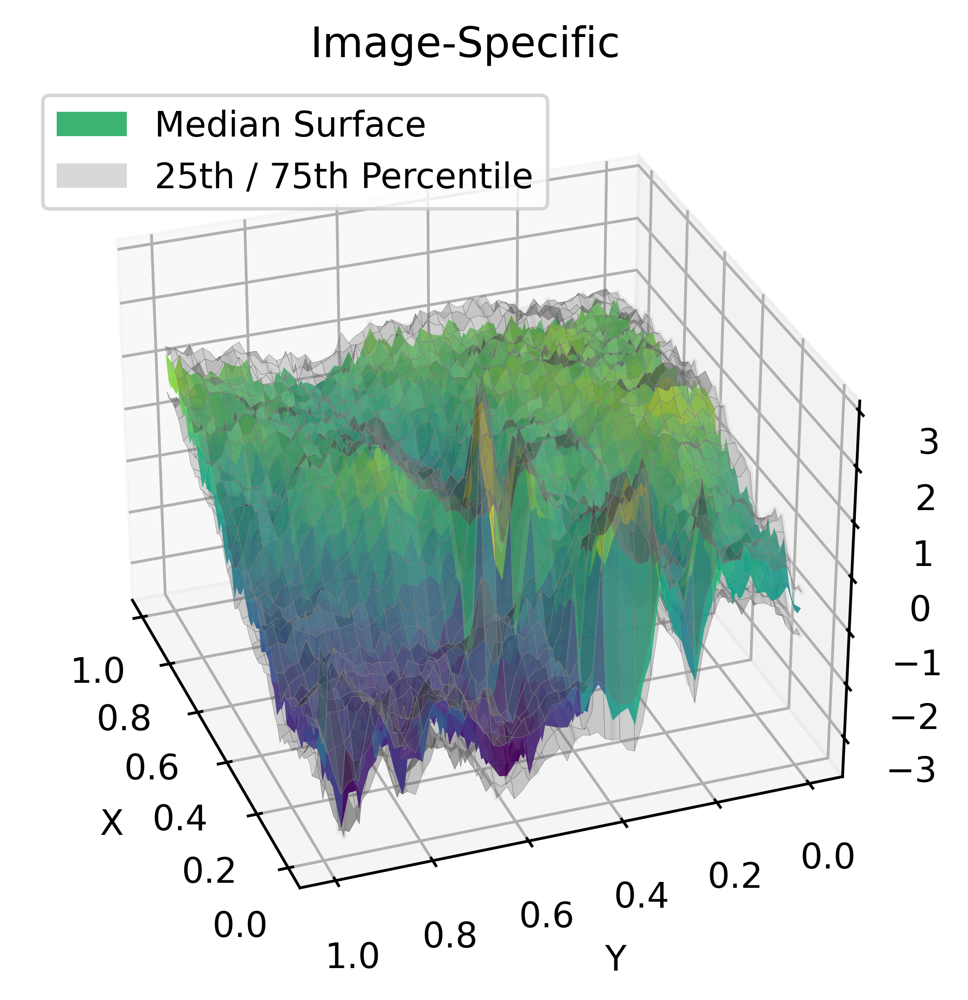

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated data: 100 surfaces over a 50x50 grid
n_samples = 100
nx, ny = 64, 64
surfaces = np.random.randn(n_samples, nx, ny)  # shape (n, nx, ny)

# X, Y grid
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

# Compute quantiles
# median_surface = median_surface.data_matrix.squeeze()
q75 = upper_surface.squeeze()
q25 = lower_surface.squeeze()

# Plot
fig = plt.figure(figsize=(6, 4), dpi=600)
ax = fig.add_subplot(111, projection='3d')

# Plot median surface
ax.plot_surface(X, Y, median_surface, cmap='viridis', alpha=0.9, label='Median')

# Plot 25th percentile surface
ax.plot_surface(
    X, Y, q75, color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    # edgealpha=.3,
    alpha=0.3
    )

# Plot 75th percentile surface
ax.plot_surface(
    X, 
    Y, 
    q25, 
    color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    alpha=0.3)

# Optional: fill between surfaces using lines
for i in range(0, nx, 5):  # less dense lines for clarity
    ax.plot(X[i], Y[i], q25[i], color='lightgray', alpha=0.4)
    ax.plot(X[i], Y[i], q75[i], color='lightgray', alpha=0.4)

ax.set_title("Image-Specific")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor='mediumseagreen', label='Median Surface'),
    Patch(facecolor='gray', alpha=0.3, label='25th / 75th Percentile')
]

ax.legend(handles=legend_elements, loc='upper left')

# ax.view_init(elev=15, azim=-100)   # shallow angle, from front-left
ax.view_init(azim=160)    # top-down



plt.tight_layout()
plt.show()


Attempted redesign

In [68]:
median = median_surface.squeeze()
median_image = median
q25 = lower_surface.squeeze()
q75 = upper_surface.squeeze()

uncertainty = q75 - q25
cov_image = uncertainty


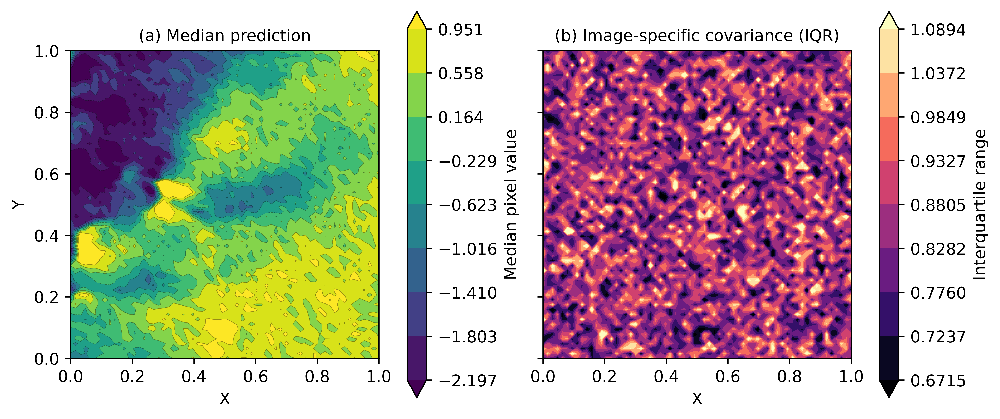

In [69]:
fig, axes = plt.subplots(
    ncols=2,
    figsize=(8.5, 4.0),
    dpi=600,
    sharex=True,
    sharey=True,
    constrained_layout=True
)

# =========================
# (a) Median field
# =========================
median_levels = np.linspace(
    np.percentile(median, 5),
    np.percentile(median, 95),
    9
)

cf0 = axes[0].contourf(
    X, Y, median,
    levels=median_levels,
    cmap="viridis",
    extend="both"
)

axes[0].contour(
    X, Y, median,
    levels=median_levels,
    colors="k",
    linewidths=0.3,
    alpha=0.4
)

axes[0].set_title("(a) Median prediction", fontsize=10)
axes[0].set_xlabel("X")
axes[0].set_ylabel("Y")
axes[0].set_aspect("equal")

cbar0 = fig.colorbar(cf0, ax=axes[0], shrink=0.85)
cbar0.set_label("Median pixel value")

# =========================
# (b) Uncertainty field
# =========================
unc_levels = np.linspace(
    np.percentile(uncertainty, 5),
    np.percentile(uncertainty, 95),
    9
)

cf1 = axes[1].contourf(
    X, Y, uncertainty,
    levels=unc_levels,
    cmap="magma",
    extend="both"
)

axes[1].set_title("(b) Image-specific covariance (IQR)", fontsize=10)
axes[1].set_xlabel("X")
axes[1].set_aspect("equal")

cbar1 = fig.colorbar(cf1, ax=axes[1], shrink=0.85)
cbar1.set_label("Interquartile range")

plt.show()


Global

In [70]:
# fd_g = FDataGrid(img_0_samples.reshape((-1, hr_data_size, hr_data_size)))
fd_g = FDataGrid(global_samples_for_plot(4))


In [71]:
# Evaluate depths on the dataset
depths = depth(fd_g)

In [72]:
# Get index of the deepest (median) surface
median_idx = np.argmax(depths)
median_surface = fd_g[median_idx].data_matrix.squeeze()

# Get central region (e.g., 50% deepest)
n = len(fd_g)
central_region_indices = np.argsort(-depths)[:n // 2]
central_region = fd_g[central_region_indices]

In [73]:
surfaces = central_region.data_matrix
lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
upper_surface = np.max(surfaces, axis=0)


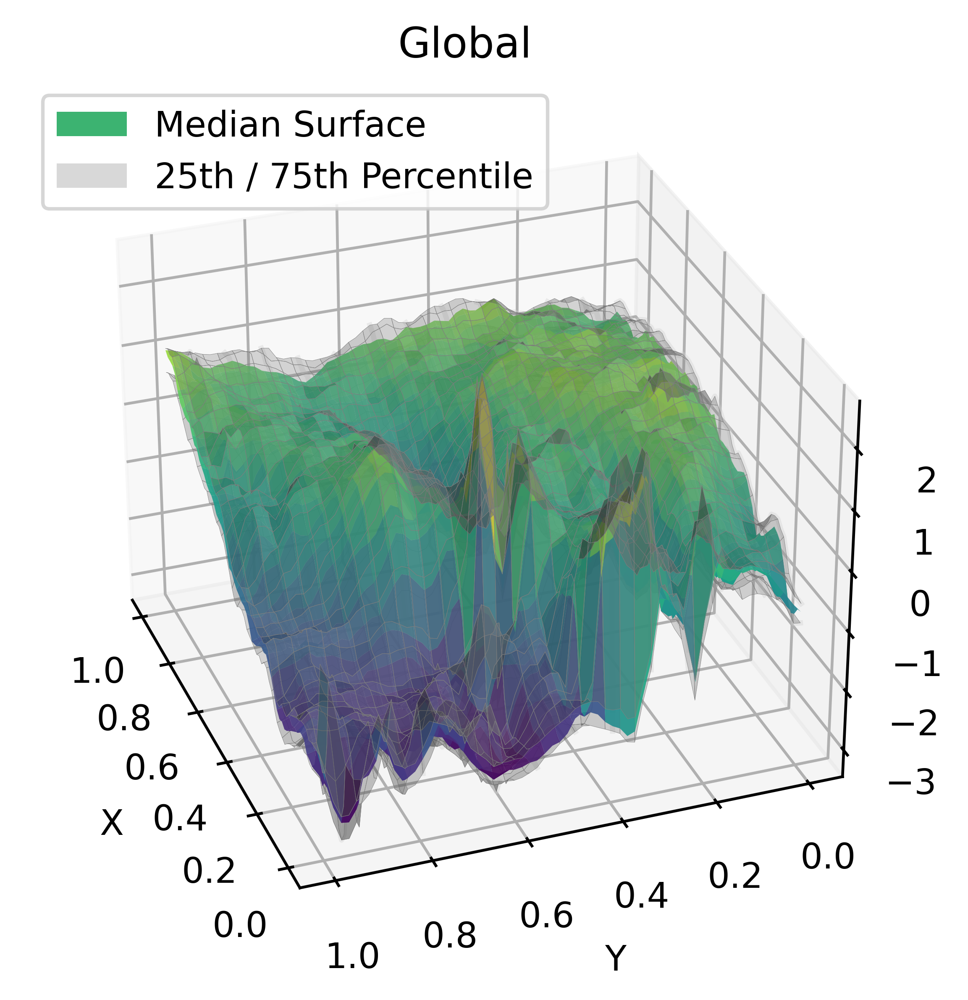

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated data: 100 surfaces over a 50x50 grid
n_samples = 100
nx, ny = 64, 64
surfaces = np.random.randn(n_samples, nx, ny)  # shape (n, nx, ny)

# X, Y grid
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

# Compute quantiles
# median_surface = median_surface.data_matrix.squeeze()
q75 = upper_surface.squeeze()
q25 = lower_surface.squeeze()

# Plot
fig = plt.figure(figsize=(6, 4), dpi=600)
ax = fig.add_subplot(111, projection='3d')

# Plot median surface
ax.plot_surface(X, Y, median_surface, cmap='viridis', alpha=0.9, label='Median')

# Plot 25th percentile surface
ax.plot_surface(
    X, Y, q75, color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    # edgealpha=.3,
    alpha=0.3
    )

# Plot 75th percentile surface
ax.plot_surface(
    X, 
    Y, 
    q25, 
    color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    alpha=0.3)

# Optional: fill between surfaces using lines
for i in range(0, nx, 5):  # less dense lines for clarity
    ax.plot(X[i], Y[i], q25[i], color='lightgray', alpha=0.4)
    ax.plot(X[i], Y[i], q75[i], color='lightgray', alpha=0.4)

ax.set_title("Global")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor='mediumseagreen', label='Median Surface'),
    Patch(facecolor='gray', alpha=0.3, label='25th / 75th Percentile')
]

ax.legend(handles=legend_elements, loc='upper left')

# ax.view_init(elev=15, azim=-100)   # shallow angle, from front-left
ax.view_init(azim=160)    # top-down



plt.tight_layout()
plt.show()


In [75]:
median = median_surface.squeeze()
median_global = median
q25 = lower_surface.squeeze()
q75 = upper_surface.squeeze()

uncertainty = q75 - q25
cov_global = uncertainty


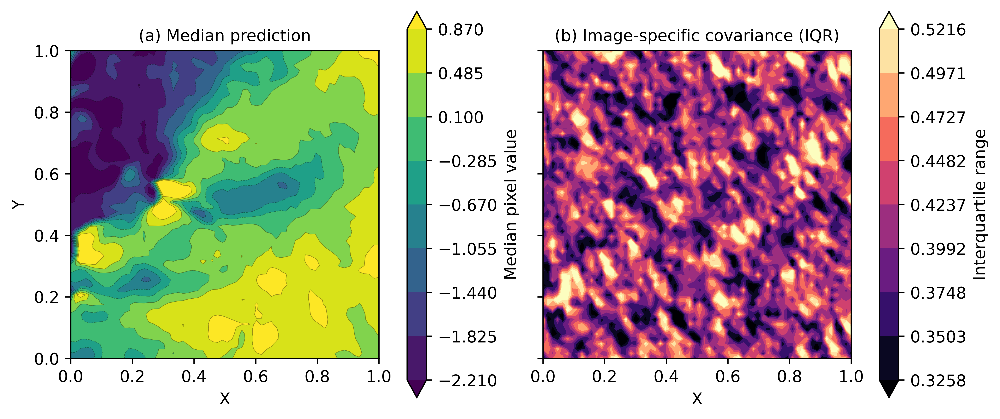

In [76]:
fig, axes = plt.subplots(
    ncols=2,
    figsize=(8.5, 4.0),
    dpi=600,
    sharex=True,
    sharey=True,
    constrained_layout=True
)

# =========================
# (a) Median field
# =========================
median_levels = np.linspace(
    np.percentile(median, 5),
    np.percentile(median, 95),
    9
)

cf0 = axes[0].contourf(
    X, Y, median,
    levels=median_levels,
    cmap="viridis",
    extend="both"
)

axes[0].contour(
    X, Y, median,
    levels=median_levels,
    colors="k",
    linewidths=0.3,
    alpha=0.4
)

axes[0].set_title("(a) Median prediction", fontsize=10)
axes[0].set_xlabel("X")
axes[0].set_ylabel("Y")
axes[0].set_aspect("equal")

cbar0 = fig.colorbar(cf0, ax=axes[0], shrink=0.85)
cbar0.set_label("Median pixel value")

# =========================
# (b) Uncertainty field
# =========================
unc_levels = np.linspace(
    np.percentile(uncertainty, 5),
    np.percentile(uncertainty, 95),
    9
)

cf1 = axes[1].contourf(
    X, Y, uncertainty,
    levels=unc_levels,
    cmap="magma",
    extend="both"
)

axes[1].set_title("(b) Image-specific covariance (IQR)", fontsize=10)
axes[1].set_xlabel("X")
axes[1].set_aspect("equal")

cbar1 = fig.colorbar(cf1, ax=axes[1], shrink=0.85)
cbar1.set_label("Interquartile range")

plt.show()


Combined plot

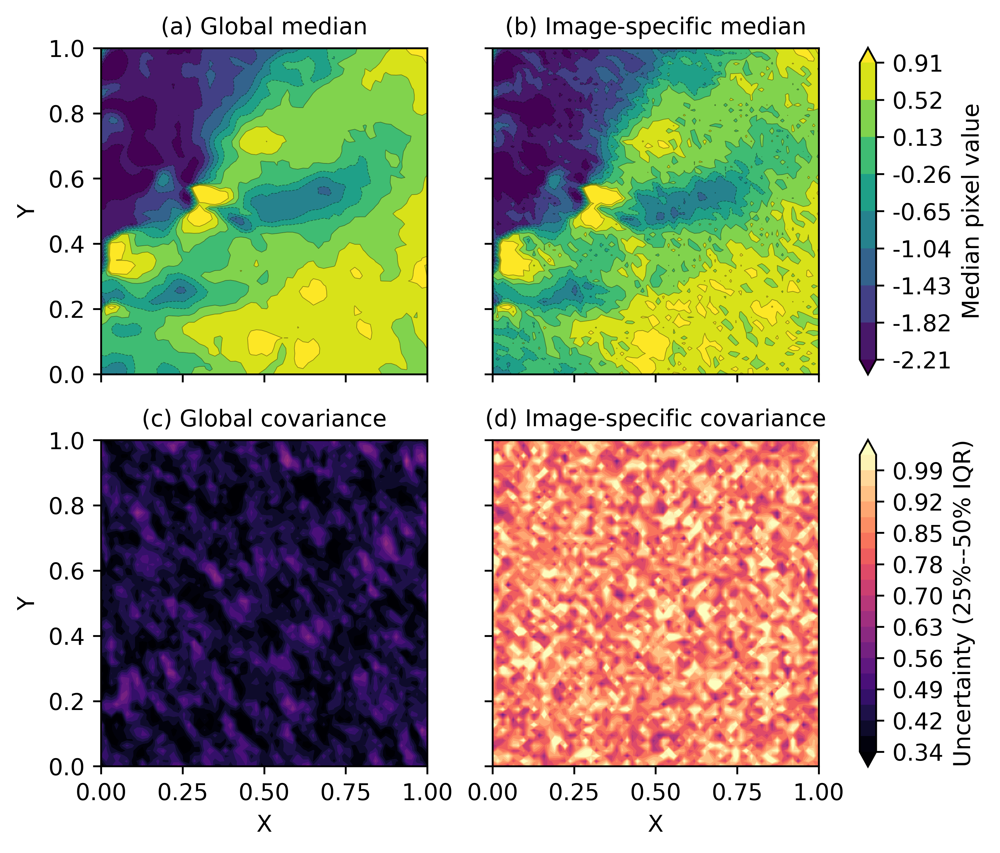

In [137]:
from matplotlib.ticker import FormatStrFormatter

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(8.5*3/4, 7.5*3/4),
    dpi=600,
    sharex=True,
    sharey=True,
    # constrained_layout=True
)

# -------------------------------------------------
# Shared color limits
# -------------------------------------------------
median_all = np.concatenate([
    median_global.ravel(),
    median_image.ravel()
])

cov_all = np.concatenate([
    cov_global.ravel(),
    cov_image.ravel()
])

median_levels = np.linspace(
    np.percentile(median_all, 5),
    np.percentile(median_all, 95),
    9
)
# median_levels = np.linspace(
#     np.min(median_all),
#     np.max(median_all),
#     9
# )

cov_levels = np.linspace(
    np.percentile(cov_all, 5),
    np.percentile(cov_all, 95),
    20
)
# cov_levels = np.linspace(
#     np.min(cov_all),
#     np.max(cov_all),
#     12
# )

# -------------------------------------------------
# (a) Global median
# -------------------------------------------------
cf00 = axes[0, 0].contourf(
    X, Y, median_global,
    levels=median_levels,
    cmap="viridis",
    extend="both"
)

axes[0, 0].contour(
    X, Y, median_global,
    levels=median_levels,
    colors="k",
    linewidths=0.3,
    alpha=0.4
)

axes[0, 0].set_title("(a) Global median", fontsize=10)
axes[0, 0].set_ylabel("Y")
axes[0, 0].set_aspect("equal")

# -------------------------------------------------
# (b) Image-specific median
# -------------------------------------------------
cf01 = axes[0, 1].contourf(
    X, Y, median_image,
    levels=median_levels,
    cmap="viridis",
    extend="both"
)

axes[0, 1].contour(
    X, Y, median_image,
    levels=median_levels,
    colors="k",
    linewidths=0.3,
    alpha=0.4
)

axes[0, 1].set_title("(b) Image-specific median", fontsize=10)
axes[0, 1].set_aspect("equal")

# -------------------------------------------------
# (c) Global covariance
# -------------------------------------------------
cf10 = axes[1, 0].contourf(
    X, Y, cov_global,
    levels=cov_levels,
    cmap="magma",
    extend="both"
)

axes[1, 0].set_title("(c) Global covariance", fontsize=10)
axes[1, 0].set_xlabel("X")
axes[1, 0].set_ylabel("Y")
axes[1, 0].set_aspect("equal")

# -------------------------------------------------
# (d) Image-specific covariance
# -------------------------------------------------
cf11 = axes[1, 1].contourf(
    X, Y, cov_image,
    levels=cov_levels,
    cmap="magma",
    extend="both"
)

axes[1, 1].set_title("(d) Image-specific covariance", fontsize=10)
axes[1, 1].set_xlabel("X")
axes[1, 1].set_aspect("equal")

# -------------------------------------------------
# Shared colorbars (row-wise)
# -------------------------------------------------
cbar_median = fig.colorbar(
    cf00,
    ax=axes[0, :],
    orientation="vertical",
    fraction=0.075,
    pad=0.05,
)
cbar_median.set_label("Median pixel value")

cbar_median.formatter = FormatStrFormatter('%.2f')
cbar_median.update_ticks()

cbar_cov = fig.colorbar(
    cf10,
    ax=axes[1, :],
    orientation="vertical",
    fraction=0.075,
    pad=0.05
)
cbar_cov.set_label("Uncertainty (25%--50% IQR)")
cbar_cov.formatter = FormatStrFormatter('%.2f')
cbar_cov.update_ticks()

plt.show()
